In [ ]:
### STEPS

#1. Crear carpeta test
#2. Poner etiqueta a todos los ficheros de la nueva carpeta 

#find . -name "*.wav" -exec sh -c 'mv "$1" "${1%.wav}-1-0-0.wav"' _ {} \;
    #0 air conditioning
    #1 children playing
    #2 dog bark
    
#3. Borrar ficheros de estas carpetas de mas de 10MG con 24bits (no los tolera)
#http://stackoverflow.com/questions/23095712/pydub-combining-audio-size-error

#4.Verificar definición de placeholders

#Referencias:
#http://www.kdnuggets.com/2016/09/urban-sound-classification-neural-networks-tensorflow.html
#https://github.com/aqibsaeed/Urban-Sound-Classification


In [1]:
import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.pyplot import specgram
%matplotlib inline

In [2]:
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 13

In [3]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

In [4]:
#SAMPLES 
#sound_file_paths = ["57320-0-0-7.wav","24074-1-0-3.wav","15564-2-0-1.wav","31323-3-0-1.wav","46669-4-0-35.wav",
#                   "89948-5-0-0.wav","40722-8-0-4.wav","103074-7-3-2.wav","106905-8-0-0.wav","108041-9-0-4.wav"]
#sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
#               "gun shot","jackhammer","siren","street music"]

#raw_sounds = load_sound_files(sound_file_paths)

In [5]:
sound_file_paths = ["/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/data/air_conditioner/57320.wav",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/data/car_horn/24074.wav",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/data/children_playing/15564.aif",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/data/dog_bark/31323.mp3",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/data/drilling/46669.wav",
                   ]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling"]

raw_sounds = load_sound_files(sound_file_paths)

/Users/alaguna/anaconda/envs/tensorflow/lib/python2.7/site-packages/matplotlib/font_manager.py:1288: UserWarning: findfont: Font family [u'serif'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


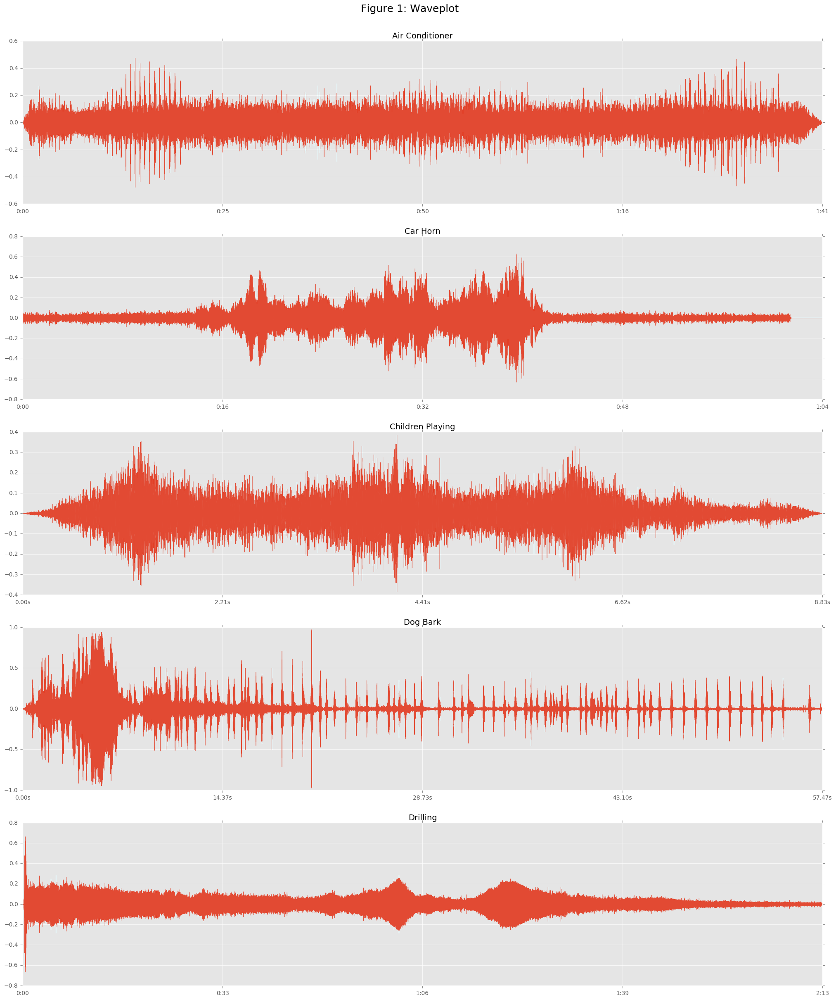

/Users/alaguna/anaconda/envs/tensorflow/lib/python2.7/site-packages/matplotlib/axes/_axes.py:7017: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


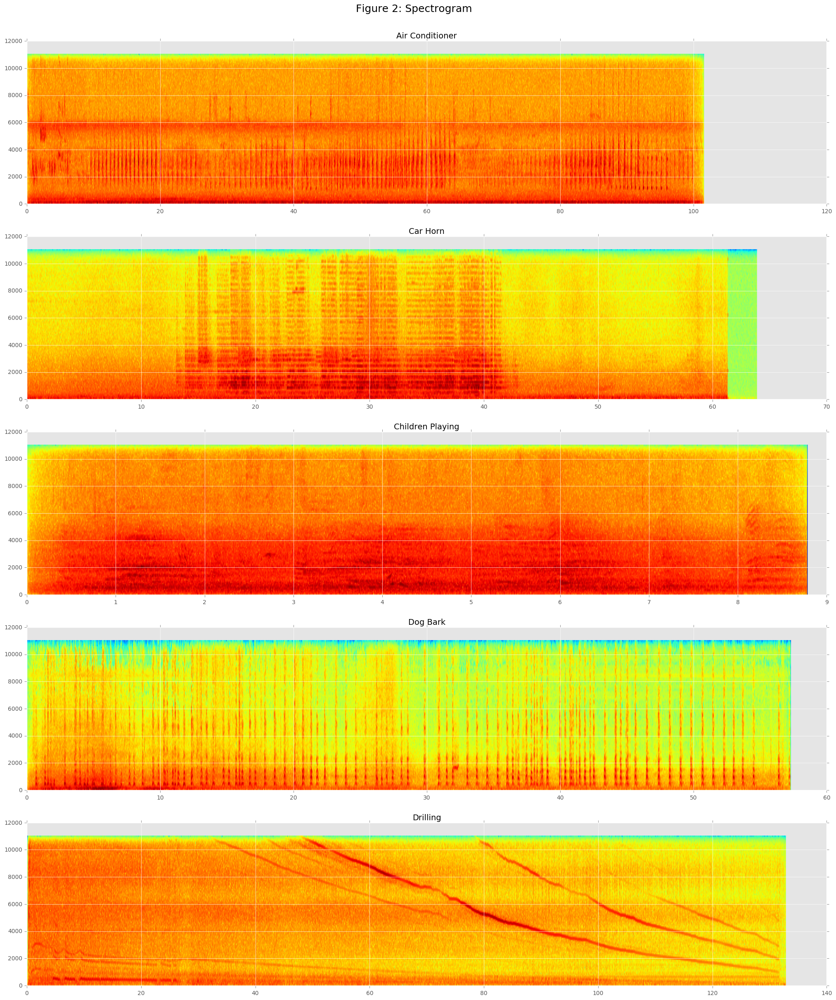

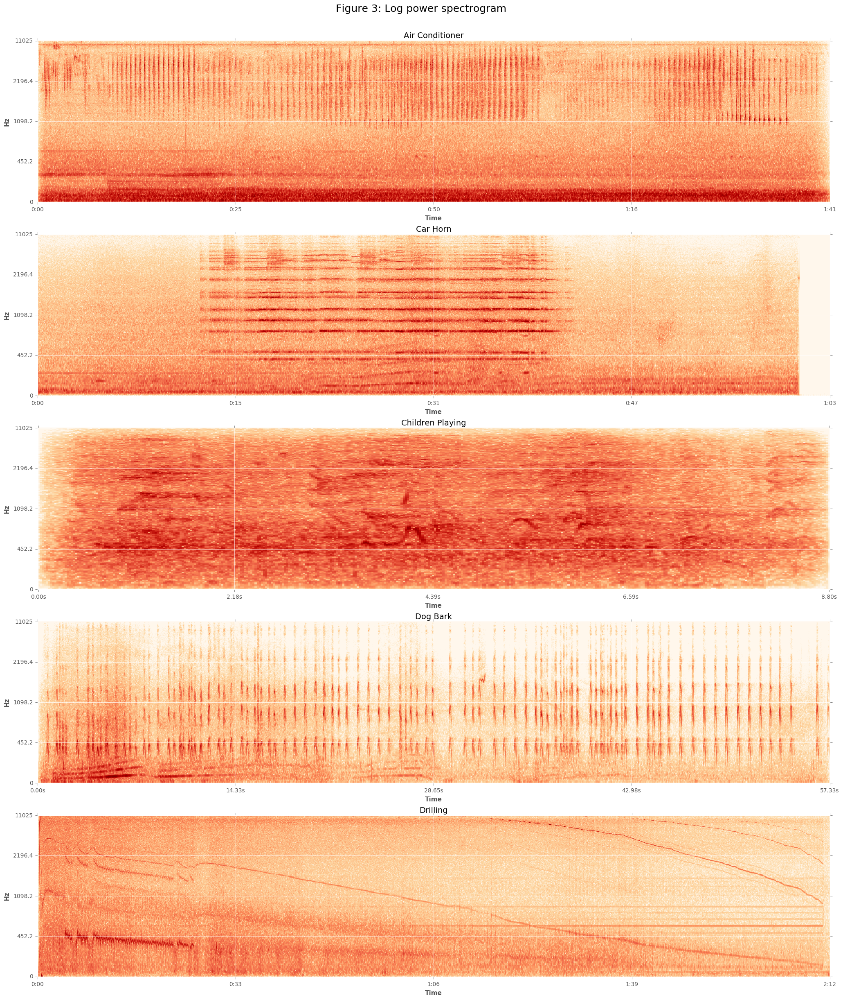

In [6]:
plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)

In [7]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

def parse_audio_files(parent_dir,sub_dirs,file_ext='*.wav'):
    features, labels = np.empty((0,193)), np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            print(fn) #wav
            print(fn.split('/')[10].split('-')[1])
            mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
            ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
            features = np.vstack([features,ext_features])
            #labels = np.append(labels, fn.split('/')[2].split('-')[1])
            labels = np.append(labels, fn.split('/')[10].split('-')[1])
    return np.array(features), np.array(labels, dtype = np.int)

def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    one_hot_encode[np.arange(n_labels), labels] = 1
    return one_hot_encode

In [30]:
#X, sample_rate = librosa.load("/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/14358-2-0-0.wav")


In [38]:
parent_dir = '/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/'
sub_dirs = ['dog_bark']
file_ext='*.wav'

features, labels = np.empty((0,193)), np.empty(0)
features, labels


for label, sub_dir in enumerate(sub_dirs):
    print(label)
    print(sub_dir)
    for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):#
        print(fn) #wav
        print(fn.split('/')[10].split('-')[1])
        mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
        #print(mfccs)
        ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
        #print(ext_features)
        features = np.vstack([features,ext_features])
        #print(features)
        labels = np.append(labels, fn.split('/')[10].split('-')[1])
        #print(labels)
    print(np.array(features), np.array(labels, dtype = np.int))

    

0
dog_bark
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/14358-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/17486-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/17810-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/18453-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/22973-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/29936-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/29937-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/30344-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/31840-2-0-0.wav
2
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/Bab

In [142]:
print features, labels

[[ -1.07789020e+02   1.44756375e+02  -3.82442143e+01 ...,   1.72933626e-02
    2.73102138e-02  -3.78660729e-03]
 [ -8.99685085e+01   1.39499243e+02  -3.54211347e+01 ...,  -6.61966313e-02
    4.67832044e-02  -1.42322668e-02]
 [ -1.92396250e+02   1.79079331e+02   1.51032132e+00 ...,  -1.04111973e-02
    1.59599142e-03   1.00172376e-03]
 ..., 
 [ -4.21993977e+02   1.51067911e+02  -9.00202348e+00 ...,   1.50580876e-02
    9.07185439e-03  -5.62310720e-03]
 [ -4.31848651e+02   1.21350929e+02   1.92132779e+01 ...,   5.03043125e-03
    3.45806103e-03   2.45565351e-03]
 [ -3.82168082e+02   1.38149506e+02   2.11885540e+01 ...,  -4.15092553e-02
    5.95189196e-03   7.01762652e-04]] [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


In [143]:
os.path.join(parent_dir, sub_dir, file_ext)

'/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/*.wav'

In [319]:
#### REAL DATA
### 3 classes

parent_dir = '/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/'
sub_dirs = ['air_conditioner','children_playing','dog_bark']
file_ext='*.wav'

features, labels = parse_audio_files(parent_dir,sub_dirs,file_ext)
print(features)
print(labels)

/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/121285-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/121286-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/134717-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/151977-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/153261-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/162103-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/165454-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/166942-0-0-0.wav
0
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/air_conditioner/18

In [320]:
import numpy as np

def convertToOneHot(vector, num_classes=None):
    """
    Converts an input 1-D vector of integers into an output
    2-D array of one-hot vectors, where an i'th input value
    of j will set a '1' in the i'th row, j'th column of the
    output array.

    Example:
        v = np.array((1, 0, 4))
        one_hot_v = convertToOneHot(v)
        print one_hot_v

        [[0 1 0 0 0]
         [1 0 0 0 0]
         [0 0 0 0 1]]
    """

    assert isinstance(vector, np.ndarray)
    assert len(vector) > 0

    if num_classes is None:
        num_classes = np.max(vector)+1
    else:
        assert num_classes > 0
        assert num_classes >= np.max(vector)

    result = np.zeros(shape=(len(vector), num_classes))
    result[np.arange(len(vector)), vector] = 1
    return result
    #return result.astype(int)

In [321]:
labels


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [322]:
convertToOneHot(labels)


array([[ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.,  0.],
       [ 0.,  1.

In [323]:
labels = convertToOneHot(labels)
print(labels)
train_test_split = np.random.rand(len(features)) < 0.70
print(train_test_split)
train_x = features[train_test_split]
print(train_x)
print(train_x.shape)
train_y = labels[train_test_split]
print(train_y)
print(type(train_y))
print(train_y.shape)
print("---")
test_x = features[~train_test_split]
print(test_x)
test_y = labels[~train_test_split]
print(test_y)

[[ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1. 

In [324]:
import tensorflow as tf
from sklearn.metrics import precision_recall_fscore_support

In [325]:
print(labels)
print(features)

[[ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1. 

In [326]:
print(features.shape)
print(labels.shape)

(135, 193)
(135, 3)


In [335]:
training_epochs = 5000
n_dim = features.shape[1]
print(n_dim)
n_classes = labels.shape[1] #3 #10  ### cambiar segun numero de clases a adivinar o columnas de labels
print(n_classes)
n_hidden_units_one = 280 
n_hidden_units_two = 300
sd = 1 / np.sqrt(n_dim)
learning_rate = 0.01

193
3


In [336]:
X = tf.placeholder(tf.float32,[None,n_dim])
print(X)
Y = tf.placeholder(tf.float32,[None,n_classes])
print(Y)


W_1 = tf.Variable(tf.random_normal([n_dim,n_hidden_units_one], mean = 0, stddev=sd))
b_1 = tf.Variable(tf.random_normal([n_hidden_units_one], mean = 0, stddev=sd))
h_1 = tf.nn.tanh(tf.matmul(X,W_1) + b_1)


W_2 = tf.Variable(tf.random_normal([n_hidden_units_one,n_hidden_units_two], mean = 0, stddev=sd))
b_2 = tf.Variable(tf.random_normal([n_hidden_units_two], mean = 0, stddev=sd))
h_2 = tf.nn.sigmoid(tf.matmul(h_1,W_2) + b_2)


W = tf.Variable(tf.random_normal([n_hidden_units_two,n_classes], mean = 0, stddev=sd))
b = tf.Variable(tf.random_normal([n_classes], mean = 0, stddev=sd))
y_ = tf.nn.softmax(tf.matmul(h_2,W) + b)

init = tf.initialize_all_variables()

Tensor("Placeholder_142:0", shape=(?, 193), dtype=float32)
Tensor("Placeholder_143:0", shape=(?, 3), dtype=float32)


In [337]:
init

In [338]:
cost_function = tf.reduce_mean(-tf.reduce_sum(Y * tf.log(y_), reduction_indices=[1])) 
print(cost_function)
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost_function)
print(optimizer)
correct_prediction = tf.equal(tf.argmax(y_,1), tf.argmax(Y,1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

Tensor("Mean_34:0", shape=(), dtype=float32)
name: "GradientDescent_17"
op: "NoOp"
input: "^GradientDescent_17/update_Variable_240/ApplyGradientDescent"
input: "^GradientDescent_17/update_Variable_241/ApplyGradientDescent"
input: "^GradientDescent_17/update_Variable_242/ApplyGradientDescent"
input: "^GradientDescent_17/update_Variable_243/ApplyGradientDescent"
input: "^GradientDescent_17/update_Variable_244/ApplyGradientDescent"
input: "^GradientDescent_17/update_Variable_245/ApplyGradientDescent"



In [339]:
import tensorflow as tf

sess = tf.Session()
sess.run(tf.initialize_all_variables())
print(sess)

In [345]:
cost_history = np.empty(shape=[1],dtype=float)
print(cost_history)
y_true, y_pred = None, None
with tf.Session() as sess:
    sess.run(init)
    for epoch in range(training_epochs): 
        #print(train_x.shape)
        #print(train_y.shape)
        #cost = sess.run([cost_function],feed_dict={ X :train_x, Y:train_y})
        _,cost = sess.run([optimizer,cost_function],feed_dict={X:train_x ,Y:train_y})
        cost_history = np.append(cost_history,cost)
    print(_,cost)
    print(cost_history)
    #print("-----")
    y_pred = sess.run(tf.argmax(y_,1),feed_dict={X: test_x})
    print(y_pred)
    y_true = sess.run(tf.argmax(test_y,1))
    print(y_true)
    print('Test accuracy: ',round(sess.run(accuracy, feed_dict={X: test_x, Y: test_y}) , 3))

    

[  1.43279037e-322]
(None, 0.0085957618)
[  1.43279037e-322   1.06644678e+000   1.02920890e+000 ...,
   8.60132277e-003   8.59854557e-003   8.59576184e-003]
[0 0 2 1 2 1 1 1 1 1 1 1 1 1 1 1 2 2 2 0 2 1 2 2 2 2 2 2 2 2 2 2 2 2]
[0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
('Test accuracy: ', 0.853)


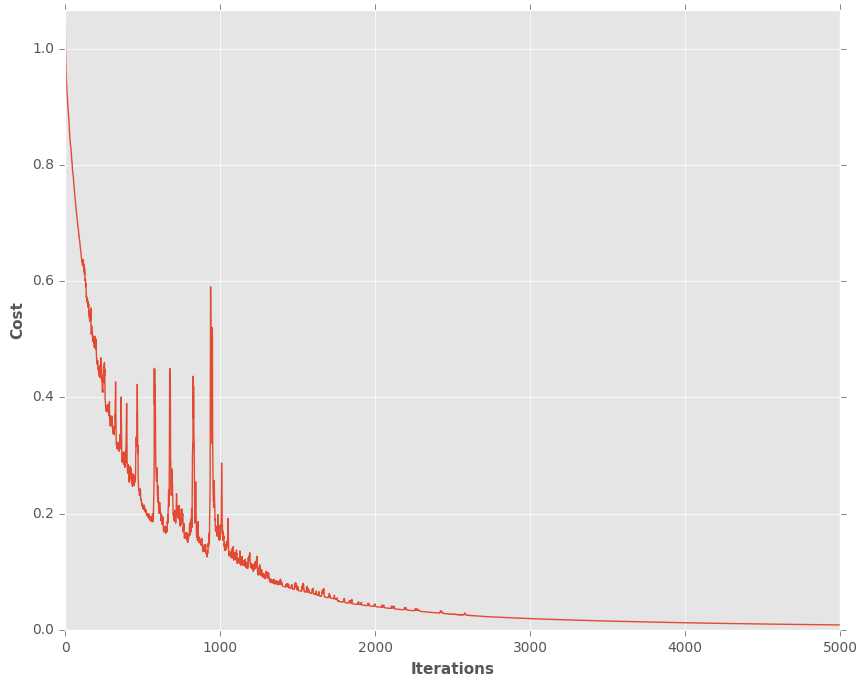

F-Score: 0.853
Precision: 0.853
Recall: 0.853


In [346]:
fig = plt.figure(figsize=(10,8))
plt.plot(cost_history)
plt.ylabel("Cost")
plt.xlabel("Iterations")
plt.axis([0,training_epochs,0,np.max(cost_history)])
plt.show()

p,r,f,s = precision_recall_fscore_support(y_true, y_pred, average='micro')
print "F-Score:", round(f,3)
print "Precision:", round(p,3)
print "Recall:", round(r,3)



In [304]:
from tensorflow.python.ops.variables import Variable

for k, v in locals().items():
    if type(v) is Variable or type(v) is tf.Tensor:
        print("{0}: {1}".format(k, v))

b: <tensorflow.python.ops.variables.Variable object at 0x12328bfd0>
X: Tensor("Placeholder_138:0", shape=(?, 193), dtype=float32)
x: Tensor("Placeholder_125:0", shape=(?, 3), dtype=float32)
cost_function: Tensor("Mean_30:0", shape=(), dtype=float32)
W: <tensorflow.python.ops.variables.Variable object at 0x123291a50>
b_1: <tensorflow.python.ops.variables.Variable object at 0x122defe10>
b_2: <tensorflow.python.ops.variables.Variable object at 0x123a76a90>
h_2: Tensor("Sigmoid_37:0", shape=(?, 300), dtype=float32)
h_1: Tensor("Tanh_37:0", shape=(?, 280), dtype=float32)
correct_prediction: Tensor("Equal_15:0", shape=(?,), dtype=bool)
Y: Tensor("Reshape_10:0", shape=(97,), dtype=float32)
y: Tensor("mul_36:0", shape=(?, 3), dtype=float32)
y_: Tensor("Softmax_37:0", shape=(?, 3), dtype=float32)
W_1: <tensorflow.python.ops.variables.Variable object at 0x11a458410>
W_2: <tensorflow.python.ops.variables.Variable object at 0x11bbe2050>
accuracy: Tensor("Mean_31:0", shape=(), dtype=float32)
